In [1]:
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

import statsmodels.api as sm
from statsmodels.iolib.summary2 import summary_col

from utils import make_precinct_counts,make_demo_map,job_cols,race_cols,cols_to_keep,scale_and_cluster,make_edname,map_round_votes

from shapely import wkt

import seaborn as sns
from sklearn.decomposition import FactorAnalysis
from sklearn.decomposition import PCA
from factor_analyzer import calculate_kmo, calculate_bartlett_sphericity

demo_cluster = pd.read_csv('../../chapter_two/data/occupation_demo_clusters_on_ed.csv')
ed_level = pd.read_csv('../../cc_election_cleaning/occupation_demo_data_feb21.csv')

ed_shapefile = '../../chapter_two/data/nyed_21a/nyed.shp'
ed_gdf = gpd.read_file(ed_shapefile)

full_results = pd.read_csv('../../cc_election_cleaning/election_results_with_vote_sponsor_cluster_FEB13.csv')
sn = full_results[full_results['candidate'] == 'Sandy Nurse']

ae = pd.read_csv('../../cc_election_cleaning/ae_precincts.csv')
av = pd.read_csv('../../cc_election_cleaning/additional_variables.csv')
fwe = pd.read_csv('../data/finance_with_ethnicity.csv')
f_plus = pd.read_csv('../../council_campaign_finance/data/iwrl_plus.csv')
occ_df = pd.read_csv('../../cc_election_cleaning/occupation_election_feb21.csv')

p_cols = [col for col in occ_df.columns if col[-1] == 'p']
wp_cols = [col for col in occ_df.columns if col.startswith("w2") and col.endswith("p")]
wp_cols.remove('w2cop')
to_remove = [ 'w2psp',
 'w2sep',
 'w2npp',
 'w2govp',
 'w2nip']
wp_cols = [col for col in wp_cols if col not in to_remove]
demo_cols = ['nhw21p','nhb21p','h21p','nha21p','cvap21bapp','mhhi21']

sn = gpd.GeoDataFrame(sn,geometry=sn['geometry'].apply(wkt.loads))
sn = sn.set_crs(epsg=2263, allow_override=True)
co_3857 = sn.to_crs(epsg=3857)

In [2]:
import matplotlib.patches as mpatches
import colorsys
from matplotlib.colors import to_hex
import contextily as ctx

In [3]:

import contextily as ctx
import seaborn as sns

In [4]:
aal = pd.read_csv('../../cc_election_cleaning/precincts_leins.csv')
all_rounds = pd.read_csv('../../cc_election_cleaning/all_rounds_results/district_37.csv')

In [3]:
for col in sn:
    if col.startswith('a') and col.endswith('p'):
        print(col)

adams213p


In [6]:
demo_occ = sn[['vote_share','ed_name','nhw21p','nhb21p','h21p','nha21p','cvap21bapp','mhhi21','venez21p','chin21p',
                 'kor21p','colomb21p','domin21p','prican21p','mex21p','white_transplant_ratio','adams213p','winda21p']].merge(occ_df, left_on='ed_name', right_on='ElectDist', how='left')
demo_occ = demo_occ.merge(ae[['ElectDist','ind21p','bang21p','pak21p','filip21p']],on = 'ElectDist',how='left')
demo_occ = demo_occ.merge(av,on='ElectDist',how='left')
demo_occ = demo_occ.merge(aal[['ElectDist','tl_count']], on='ElectDist', how='left')

In [7]:
demo_occ['log_mhhi21'] = np.log(demo_occ['mhhi21'])

In [8]:
test_cols = ['vote_share','nhw21p','nhb21p','h21p','nha21p','cvap21bapp','log_mhhi21','venez21p','chin21p','kor21p','colomb21p','domin21p','prican21p',
'mex21p','white_transplant_ratio','ind21p','bang21p','pak21p','filip21p','greek21p','arab21p',
'fb21bdp','fb21drp','hh21bop','tl_count','adams213p'] + wp_cols

In [8]:
cor_matrix = demo_occ[test_cols].corr()
cor_matrix.dropna(subset=('vote_share'),inplace=True)
cor_matrix.sort_values(by='vote_share', ascending=False)

,vote_share,nhw21p,nhb21p,h21p,nha21p,cvap21bapp,log_mhhi21,venez21p,chin21p,kor21p,...,w2bgp,w2pservep,w2salep,w2oadp,w2farmp,w2conp,w2emrp,w2prodp,w2tranp,w2matp
vote_share,1.000000,0.569006,-0.098475,-0.028468,-0.454995,0.667332,0.059846,0.181870,-0.216049,0.438395,...,-0.219232,-0.430932,-0.270366,0.024915,0.122163,-0.197748,-0.126309,0.116840,-0.520496,-0.282704
white_transplant_ratio,0.667688,0.945450,-0.386545,-0.071592,-0.093751,0.902649,0.114678,0.142765,-0.024979,0.716406,...,-0.263717,-0.265580,-0.228587,-0.113649,0.130475,-0.172431,-0.052537,0.151622,-0.385197,-0.384518
cvap21bapp,0.667332,0.891866,-0.467175,0.049727,-0.086464,1.000000,0.121715,0.206442,0.059244,0.732027,...,-0.335524,-0.379093,-0.231141,-0.102138,0.192689,-0.132586,-0.043113,0.203686,-0.440840,-0.338368
w2admp,0.625564,0.742892,-0.252657,-0.078044,-0.128662,0.814503,0.131210,0.278532,0.007099,0.641303,...,-0.227203,-0.295020,-0.227632,-0.152807,0.267193,-0.259253,-0.090054,0.123612,-0.421210,-0.334395
nhw21p,0.569006,1.000000,-0.449252,-0.085469,-0.006252,0.891866,0.121489,0.146200,-0.035080,0.691862,...,-0.258812,-0.222893,-0.222861,-0.151602,0.240059,-0.197663,-0.048212,0.225058,-0.346316,-0.426900
w2cmp,0.471854,0.475223,0.012471,-0.185845,-0.199467,0.582867,0.052148,0.391069,-0.187195,0.283190,...,-0.255828,-0.233879,-0.388768,0.023556,-0.011046,-0.302314,-0.039579,0.128160,-0.311461,-0.279392
kor21p,0.438395,0.691862,-0.480235,0.131433,-0.002023,0.732027,0.144844,0.005072,0.099649,1.000000,...,-0.200052,-0.243058,-0.065935,-0.069774,0.128264,-0.036637,-0.084273,0.383693,-0.305034,-0.083939
mex21p,0.406050,0.407324,-0.548250,0.464585,-0.223959,0.483915,-0.202228,0.219533,-0.020419,0.504199,...,-0.036841,-0.274892,0.049852,0.050237,-0.046885,0.068178,0.109764,0.155423,-0.269889,-0.115699
filip21p,0.382852,0.614105,-0.391624,0.082896,0.044661,0.585578,0.096469,0.233596,-0.091787,0.380375,...,-0.072824,-0.177812,-0.090452,-0.130535,-0.053331,-0.159993,-0.039816,0.169194,-0.194673,-0.341761
greek21p,0.355117,0.478096,-0.276443,0.024954,-0.048965,0.467692,0.085402,-0.102325,-0.001321,0.412518,...,-0.082850,-0.041646,-0.061244,0.001947,-0.049713,-0.154792,0.059076,0.132976,-0.184002,-0.203475


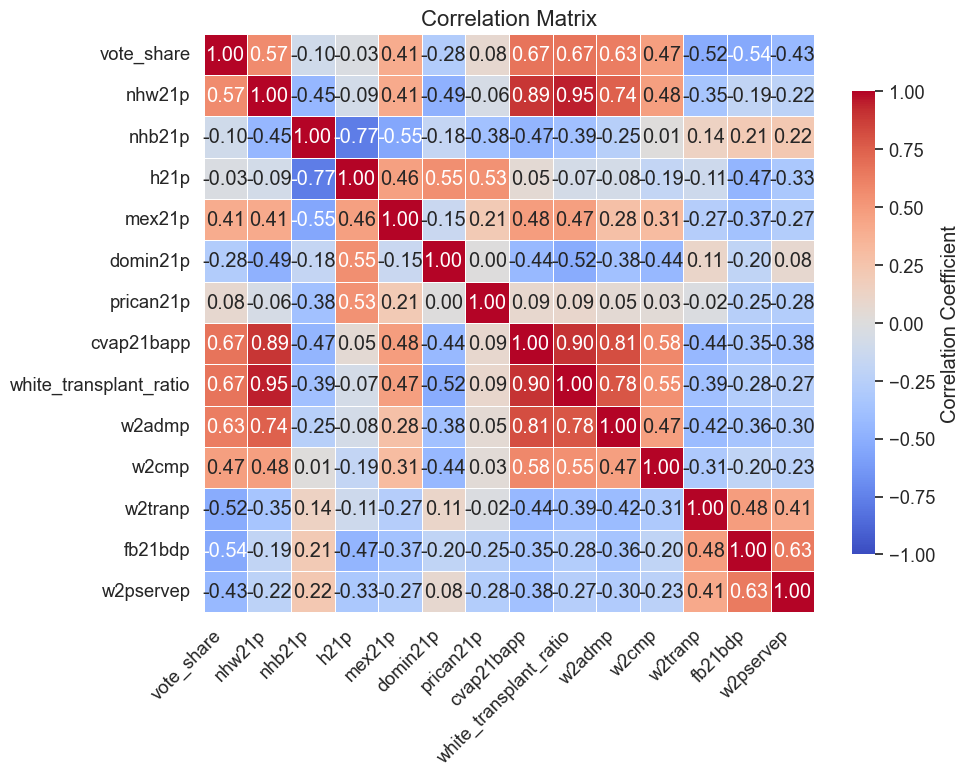

In [18]:
small_cor_cols = ['vote_share','nhw21p','nhb21p','h21p','mex21p','domin21p','prican21p','cvap21bapp','white_transplant_ratio','w2admp','w2cmp','w2tranp','fb21bdp','w2pservep']
small_cor_matrix = demo_occ[small_cor_cols].corr()
small_cor_matrix.dropna(subset=('vote_share'),inplace=True) 
#small_cor_matrix.rename(index=label_map, columns=label_map, inplace=True)

plt.figure(figsize=(10, 8))
sns.set(style="white", font_scale=1.2)

heatmap = sns.heatmap(
    small_cor_matrix,
    annot=True,             
    fmt=".2f",             
    cmap="coolwarm",        
    vmin=-1, vmax=1,        
    linewidths=0.5,         
    cbar_kws={"shrink": 0.8, 'label': 'Correlation Coefficient'}
)

plt.title("Correlation Matrix", fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

In [11]:
kmo_all, kmo_model = calculate_kmo(demo_occ[test_cols])
chi_square_value, p_value = calculate_bartlett_sphericity(demo_occ[test_cols])

print("KMO per item:", kmo_all)
print("Overall KMO:", kmo_model)       
print("Bartlett’s test χ²:", chi_square_value, "p-value:", p_value) 

KMO per item: [0.60094748 0.4720394  0.34312772 0.35297538 0.59807038 0.50391513
 0.22922311 0.16297829 0.5747347  0.23287512 0.36743231 0.15119897
 0.37508848 0.56024177 0.3897018  0.43357667 0.18363853 0.52708541
 0.53940695 0.26557712 0.67707141 0.6271476  0.45513794 0.38320025
 0.58698546 0.27883082 0.26312394 0.42875506 0.41163037 0.26825868
 0.25802252 0.26402379 0.11596018 0.63481826 0.09694056 0.39027222
 0.50101686 0.37003624 0.33189065 0.46451702 0.3536496  0.50353582
 0.29000322 0.40182695 0.27437454 0.33444124 0.30029432 0.18489281
 0.35017334 0.35695037]
Overall KMO: 0.39091746083890155
Bartlett’s test χ²: 6287.544570419256 p-value: 0.0


In [12]:
def iterative_kmo_prune(df, threshold_item=0.50, threshold_overall=0.60):
    from factor_analyzer import calculate_kmo
    df_current = df.copy()
    while True:
        kmo_items, kmo_overall = calculate_kmo(df_current)
        worst_idx = kmo_items.argmin()
        if (kmo_overall >= threshold_overall and 
            all(kmo_items >= threshold_item)):
            break
        drop_var = df_current.columns[worst_idx]
        print(f"Dropping '{drop_var}' (KMO={kmo_items[worst_idx]:.3f}); new overall KMO before recalculation = {kmo_overall:.3f}")
        df_current = df_current.drop(columns=[drop_var])
    return df_current

In [13]:
pruned_df = iterative_kmo_prune(demo_occ[test_cols])

Dropping 'w2docp' (KMO=0.097); new overall KMO before recalculation = 0.391
Dropping 'w2edup' (KMO=0.119); new overall KMO before recalculation = 0.428
Dropping 'w2farmp' (KMO=0.218); new overall KMO before recalculation = 0.489
Dropping 'prican21p' (KMO=0.202); new overall KMO before recalculation = 0.484
Dropping 'w2scip' (KMO=0.177); new overall KMO before recalculation = 0.515
Dropping 'w2prodp' (KMO=0.238); new overall KMO before recalculation = 0.530
Dropping 'chin21p' (KMO=0.247); new overall KMO before recalculation = 0.545
Dropping 'w2lawp' (KMO=0.274); new overall KMO before recalculation = 0.553
Dropping 'pak21p' (KMO=0.301); new overall KMO before recalculation = 0.558
Dropping 'arab21p' (KMO=0.289); new overall KMO before recalculation = 0.556
Dropping 'w2cossp' (KMO=0.369); new overall KMO before recalculation = 0.592
Dropping 'w2copp' (KMO=0.377); new overall KMO before recalculation = 0.601
Dropping 'w2conp' (KMO=0.414); new overall KMO before recalculation = 0.625
Drop

In [14]:
predictors = pruned_df.columns.tolist()
X = demo_occ[predictors]

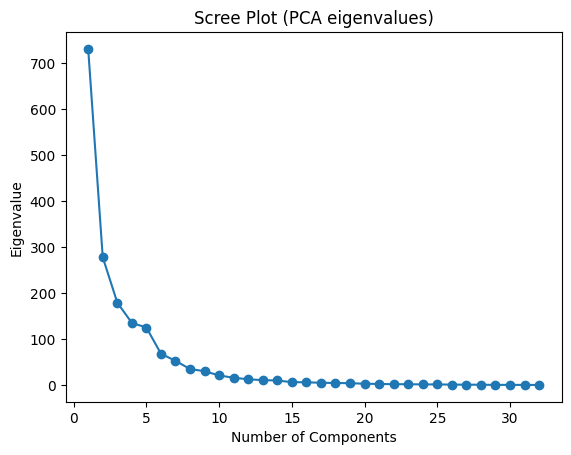

In [15]:
pca = PCA()
pca.fit(X)

ev = pca.explained_variance_

plt.plot(range(1, len(ev) + 1), ev, marker='o')
plt.title('Scree Plot (PCA eigenvalues)')
plt.xlabel('Number of Components')
plt.ylabel('Eigenvalue')
plt.show()

In [16]:
n_factors = 4
fa = FactorAnalysis(n_components=n_factors, random_state=0)
factor_scores = fa.fit_transform(X)

In [17]:
fa_df = pd.DataFrame(
    factor_scores,
    columns=[f'Factor{i+1}' for i in range(n_factors)],
    index=demo_occ.index
)

In [18]:
loadings = pd.DataFrame(
    fa.components_.T,
    index=predictors,
    columns=fa_df.columns
)
print("Factor Loadings:\n", loadings)

Factor Loadings:
                           Factor1    Factor2    Factor3   Factor4
nhw21p                  -5.720190   5.367901   1.318882 -1.995765
nhb21p                  10.072551  -5.381529  11.823748 -3.102089
nha21p                   2.792659   3.669791  -1.969998 -0.002679
cvap21bapp              -8.129159   5.323111   1.718661 -2.120227
kor21p                  -0.221446   0.161937   0.001972 -0.032402
colomb21p               -0.343409   0.200092  -0.303044  0.080010
domin21p                 0.647828  -6.007321  -6.352803 -2.632199
mex21p                  -3.013219   0.889458  -0.601532  1.248234
white_transplant_ratio  -3.568597   2.817306   1.243901 -1.097864
ind21p                   2.521941   1.906494  -0.944311 -0.278860
bang21p                  1.035761   0.536247  -0.060944  0.091311
filip21p                -0.305981   0.240090  -0.015776 -0.086102
greek21p                -0.058146   0.050326   0.016561  0.009331
fb21bdp                  3.906877   2.751992  -0.680331 -0

In [19]:
Y = demo_occ['vote_share']
model_fa = sm.OLS(Y, sm.add_constant(fa_df)).fit()
print(model_fa.summary())

                            OLS Regression Results                            
Dep. Variable:             vote_share   R-squared:                       0.628
Model:                            OLS   Adj. R-squared:                  0.613
Method:                 Least Squares   F-statistic:                     40.97
Date:                Wed, 03 Sep 2025   Prob (F-statistic):           4.56e-20
Time:                        15:36:55   Log-Likelihood:                -391.21
No. Observations:                 102   AIC:                             792.4
Df Residuals:                      97   BIC:                             805.5
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         47.0450      1.138     41.349      0.0

In [22]:
demo_occ['factor1'] = fa_df['Factor1']
demo_occ['factor2'] = fa_df['Factor2']
demo_occ['factor3'] = fa_df['Factor3']
demo_occ['factor4'] = fa_df['Factor4']
demo_occ['factor5'] = fa_df['Factor5']

In [23]:
demo_occ_map = gpd.GeoDataFrame(demo_occ,geometry=demo_occ['geometry_x'].apply(wkt.loads))

Text(0.5, 1.0, 'Vote Share by Election District')

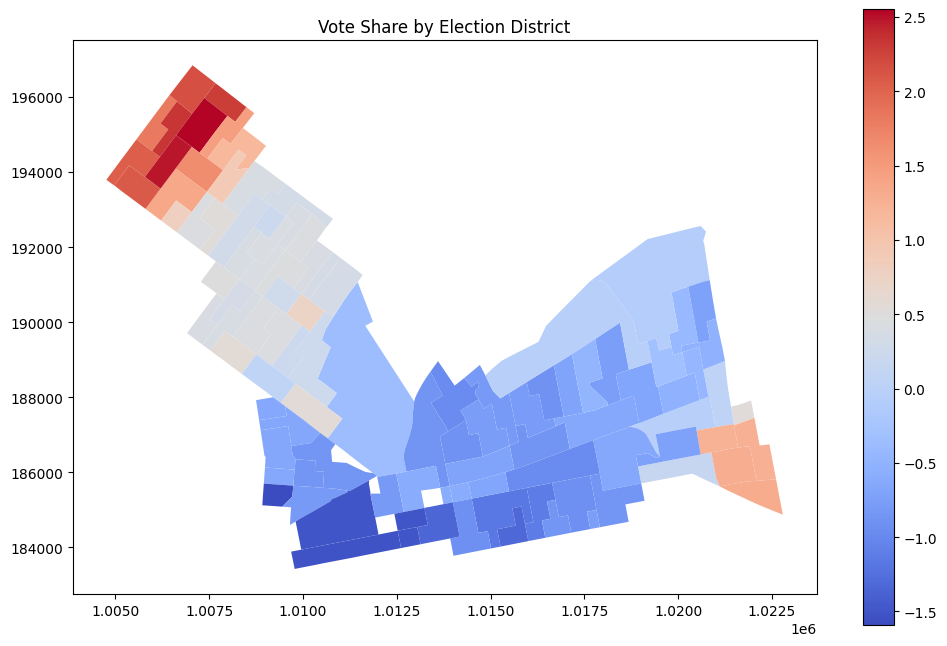

In [31]:
demo_occ_map.plot(column='factor2', cmap='coolwarm', legend=True, figsize=(12, 8))
plt.title('Vote Share by Election District')

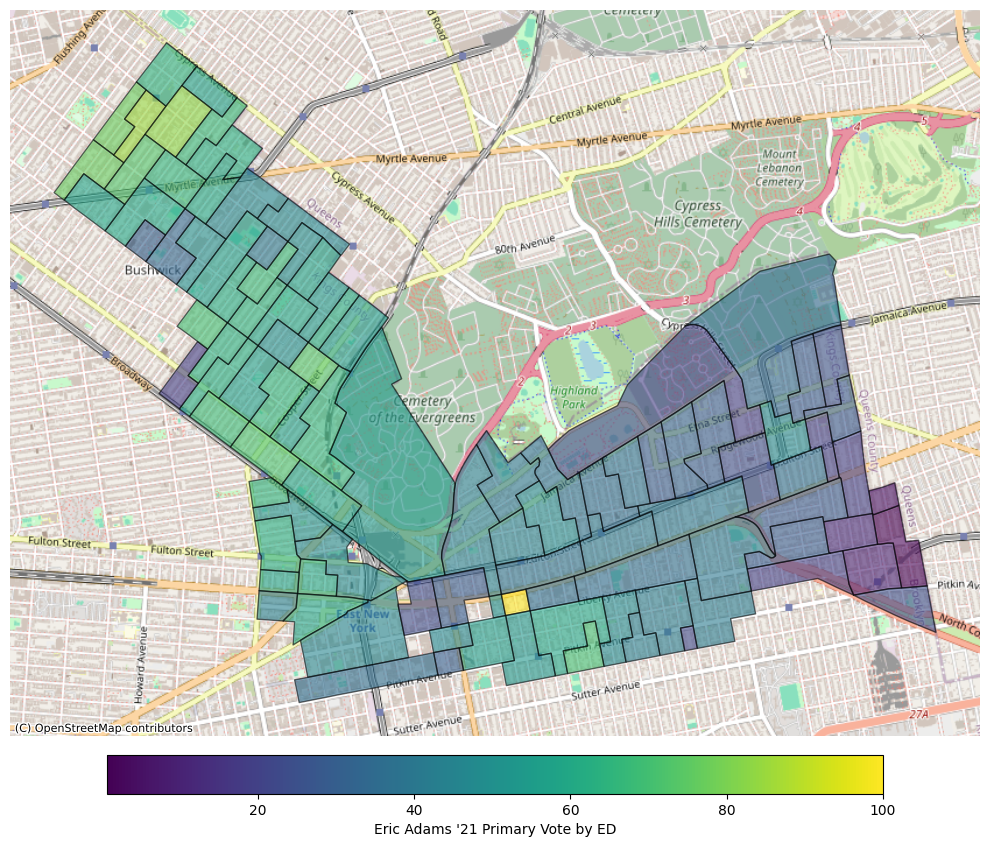

In [77]:
fig, ax = plt.subplots(figsize=(10, 10))
co_3857.plot(
    column="vote_share",
    legend=True,
    legend_kwds={
        "label": "Eric Adams '21 Primary Vote by ED",
        "orientation": "horizontal",
        "shrink": 0.8,        
        "pad": 0.02            
    },
    ax=ax,
    alpha=0.6,
    edgecolor="k",
    cmap="viridis",
)

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

ax.set_axis_off()
plt.tight_layout()
plt.show()

In [84]:
demo_occ_map = gpd.GeoDataFrame(demo_occ,geometry=demo_occ['geometry_x'].apply(wkt.loads))

In [85]:
gdf = demo_occ_map.copy()

In [86]:
gdf['nbb'] = gdf['nhb21p'] - gdf['winda21p']

In [87]:
eth_cols = ['ind21p','bang21p','domin21p','venez21p','mex21p','white_transplant_ratio','winda21p','nbb']
red_eth_cols = ['nhw21p','nhb21p','h21p','nha21p']

In [48]:
gdf[eth_cols].describe()

,ind21p,bang21p,domin21p,venez21p,mex21p,white_transplant_ratio,nhb21p
count,102.000000,102.000000,102.000000,102.000000,102.000000,102.000000,102.000000
mean,1.925930,0.586460,17.232371,0.310284,6.073446,4.838103,28.271735
std,3.490378,1.499415,9.358422,0.457214,5.005961,5.034626,17.029663
min,0.000000,0.000000,1.667174,0.000000,0.000000,0.000000,1.994181
25%,0.216097,0.000000,9.058785,0.000000,1.802334,0.745278,14.146635
50%,0.742172,0.000000,15.108429,0.046036,5.008067,1.855895,26.757644
75%,1.899080,0.000000,24.014127,0.410959,9.803735,8.222806,41.102657
max,17.871257,9.562564,38.602114,1.712349,20.835518,19.109543,86.662624


In [88]:
gdf['laptop'] = gdf['w2admp'] + gdf['w2banp'] + gdf['w2cmp']

In [ ]:
gdf['laptop'] = gdf['w2admp'] + gdf['w2banp'] + gdf['w2cmp']

gdf['dom_eth']   = gdf[eth_cols].idxmax(axis=1)  
gdf['dom_eth_p'] = gdf[eth_cols].max(axis=1)     

gdf['dom_red_eth']   = gdf[red_eth_cols].idxmax(axis=1)
gdf['dom_red_eth_p'] = gdf[red_eth_cols].max(axis=1)

gdf['dom_occ']   = gdf[wp_cols].idxmax(axis=1)
gdf['dom_occ_p'] = gdf[wp_cols].max(axis=1)

In [52]:
def make_distinct_colormap(categories, palette_name='tab20'):
    """
    Returns dict mapping each category to a hex color, 
    drawn from Matplotlib’s qualitative palette.
    """
    n = len(categories)
    # grab n distinct colors from the palette
    palette = plt.get_cmap(palette_name).colors
    if n > len(palette):
        raise ValueError(f"Palette {palette_name} only has {len(palette)} colors")
    colors = palette[:n]
    return dict(zip(categories, (to_hex(c) for c in colors)))

eth_colors = make_distinct_colormap(sorted(gdf['dom_eth'].unique()), 'tab20')
occ_colors = make_distinct_colormap(sorted(gdf['dom_occ'].unique()), 'tab20')

# 2) map them into new columns on your GeoDataFrame
gdf['eth_color'] = gdf['dom_eth'].map(eth_colors)
gdf['occ_color'] = gdf['dom_occ'].map(occ_colors)

def pct_to_color(hue, pct):
    """
    Convert hue [0–1] & pct [0–100] to an RGB hex.
    We fix saturation=0.7 and vary value/lightness between 0.4 and 1.
    """
    sat = 0.7
    # map 0–100 → 0.4–1.0
    val = 0.4 + 0.6*(pct/100)
    r, g, b = colorsys.hsv_to_rgb(hue, sat, val)
    return (r, g, b)

In [90]:
gdf = gdf.set_crs(epsg=2263, allow_override=True)
gdf_3857 = gdf.to_crs(epsg=3857)

In [91]:
occ_label_map = {
    'w2admp': 'Designers & Journalists',
    'w2banp': 'Analyst Specialist',
    'w2bgp': 'Janitorial',
    'w2conp': 'Construction',
    'w2copp': 'Law Enforcement',
    'w2foodp': 'Food Service',
    'w2hsp': 'Homecare',
    'w2mgtp': 'Management',
    'w2oadp': 'Office Admin',
    'w2salep': 'Sales'
}

gdf_3857['occupation_label'] = gdf_3857['dom_occ'].map(occ_label_map)
gdf_3857['occupation_label'] = gdf_3857['occupation_label'].astype('category')

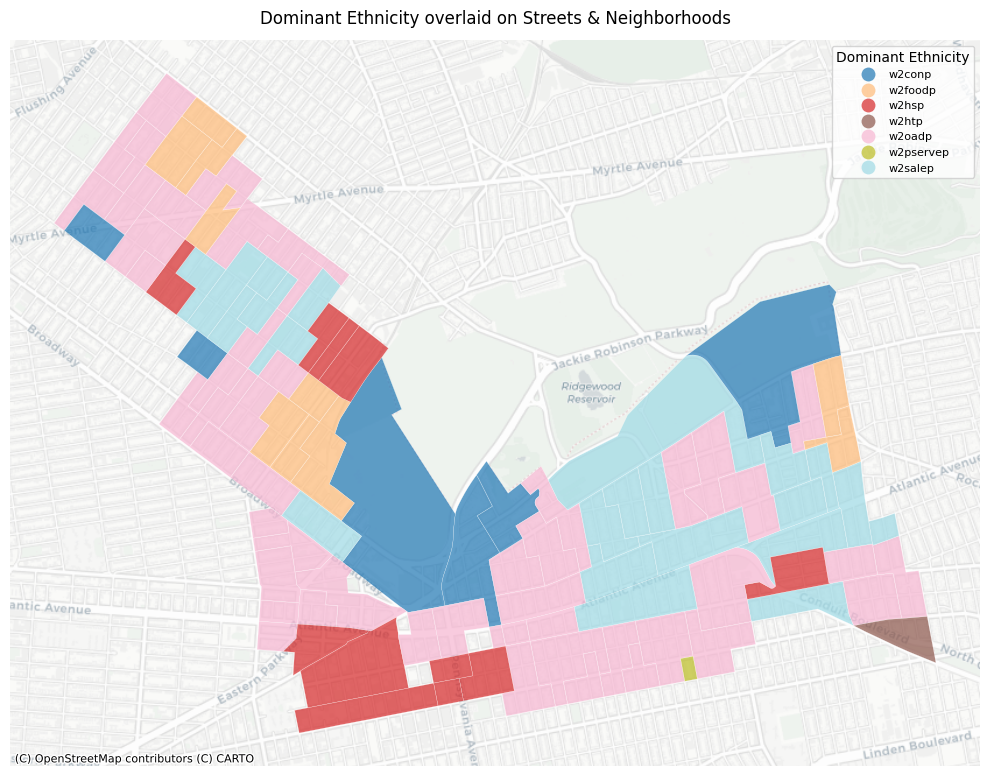

In [94]:
fig, ax = plt.subplots(figsize=(10, 10))

gdf_3857.plot(
    column='dom_occ',
    categorical=True,
    cmap='tab20',
    legend=True,
    alpha=0.7,
    ax=ax,
    edgecolor='white',
    linewidth=0.2,
    legend_kwds={'title': 'Dominant Ethnicity', 'fontsize': 8, 'title_fontsize': 10}
)


ctx.add_basemap(
    ax,
    source=ctx.providers.CartoDB.Positron,  
    zoom=14   
)

# 5) Clean up
ax.set_axis_off()
ax.set_title("Dominant Ethnicity overlaid on Streets & Neighborhoods", pad=12)

plt.tight_layout()
plt.show()

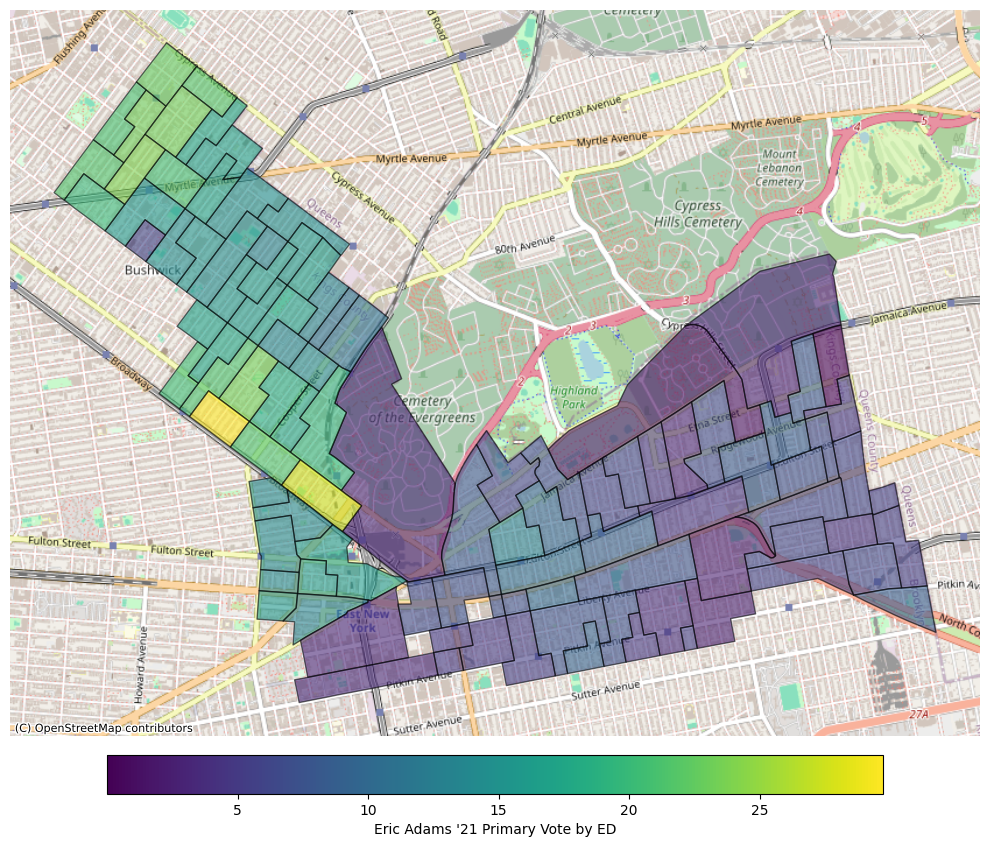

In [98]:
fig, ax = plt.subplots(figsize=(10, 10))
gdf_3857.plot(
    column="laptop",
    legend=True,
    legend_kwds={
        "label": "Eric Adams '21 Primary Vote by ED",
        "orientation": "horizontal",
        "shrink": 0.8,        
        "pad": 0.02            
    },
    ax=ax,
    alpha=0.6,
    edgecolor="k",
    cmap="viridis",
)

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

ax.set_axis_off()
plt.tight_layout()
plt.show()

Round voting

In [9]:
all_rounds = make_edname(all_rounds)

In [18]:
second_choice = all_rounds.groupby(['ed_name','district_37_choice_1'])['district_37_choice_2'].value_counts(dropna=False).reset_index(name='count')

In [19]:
second_choice

,ed_name,district_37_choice_1,district_37_choice_2,count
0,53050,Darma V. Diaz,NaN,4
1,53050,Darma V. Diaz,Sandy Nurse,2
2,53050,Heriberto Mateo,Darma V. Diaz,2
3,53050,Misba Abdin,NaN,1
4,53050,Rick Echevarria,NaN,1
...,...,...,...,...
2225,60023,Misba Abdin,Heriberto Mateo,1
2226,60023,Sandy Nurse,NaN,3
2227,60023,Sandy Nurse,Darma V. Diaz,2
2228,60023,Sandy Nurse,Heriberto Mateo,1


In [ ]:
def aggregate_precinct_counts(df):
    mask_lr_ea = (df['district_33_choice_1'] == "Lincoln Restler") & (df['district_33_choice_2'] == "Elizabeth E. Adams")
    mask_lr_notea = (df['district_33_choice_1'] == "Lincoln Restler") & (df['district_33_choice_2'] != "Elizabeth E. Adams")
    mask_ea_lr = (df['district_33_choice_1'] == "Elizabeth E. Adams") & (df['district_33_choice_2'] == "Lincoln Restler")
    mask_ea_notlr = (df['district_33_choice_1'] == "Elizabeth E. Adams") & (df['district_33_choice_2'] != "Lincoln Restler")
    mask_neither = (df['district_33_choice_1'] != "Elizabeth E. Adams") & (df['district_33_choice_1'] != "Lincoln Restler")
    

    df['lr_ea'] = df['count'] * mask_lr_ea.astype(int)
    df['lr_notea'] = df['count'] * mask_lr_notea.astype(int)
    df['ea_lr'] = df['count'] * mask_ea_lr.astype(int)
    df['ea_notlr'] = df['count'] * mask_ea_notlr.astype(int)
    df['neither'] = df['count'] * mask_neither.astype(int)

    result = df.groupby('ed_name')[['lr_ea', 'lr_notea', 'ea_lr', 'ea_notlr','neither']].sum().reset_index()
    
    return result

In [20]:
def aggregate_precinct_counts(df,
                              cand1,
                              cand2,
                              choice1_col='district_33_choice_1',
                              choice2_col='district_33_choice_2',
                              count_col='count',
                              ed_col='ed_name'):
    """
    Aggregate counts for combinations of two candidates on choice1 and choice2.
    cand1 / cand2 may be a string or a list of equivalent name strings (aliases).
    Returns a dataframe grouped by ed_col with summed columns and percentage shares.
    """
    df = df.copy()

    # normalize inputs to lists (so user can pass "Sandy Nurse" or ["Sandy Nurse", "S. Nurse"])
    cand1_list = cand1 if isinstance(cand1, (list, tuple, set)) else [cand1]
    cand2_list = cand2 if isinstance(cand2, (list, tuple, set)) else [cand2]

    c1 = choice1_col
    c2 = choice2_col
    cnt = count_col
    ed = ed_col

    mask_c1_c2 = df[c1].isin(cand1_list) & df[c2].isin(cand2_list)
    mask_c1_notc2 = df[c1].isin(cand1_list) & ~df[c2].isin(cand2_list)
    mask_c2_c1 = df[c1].isin(cand2_list) & df[c2].isin(cand1_list)
    mask_c2_notc1 = df[c1].isin(cand2_list) & ~df[c2].isin(cand1_list)
    mask_neither = ~df[c1].isin(cand1_list + cand2_list)

    # column names are generated dynamically so function is generic
    col_c1_c2 = f"{cand1_list[0].replace(' ','_').lower()}_{cand2_list[0].replace(' ','_').lower()}"
    col_c1_notc2 = f"{cand1_list[0].replace(' ','_').lower()}_not_{cand2_list[0].replace(' ','_').lower()}"
    col_c2_c1 = f"{cand2_list[0].replace(' ','_').lower()}_{cand1_list[0].replace(' ','_').lower()}"
    col_c2_notc1 = f"{cand2_list[0].replace(' ','_').lower()}_not_{cand1_list[0].replace(' ','_').lower()}"

    df[col_c1_c2] = df[cnt] * mask_c1_c2.astype(int)
    df[col_c1_notc2] = df[cnt] * mask_c1_notc2.astype(int)
    df[col_c2_c1] = df[cnt] * mask_c2_c1.astype(int)
    df[col_c2_notc1] = df[cnt] * mask_c2_notc1.astype(int)
    df['neither'] = df[cnt] * mask_neither.astype(int)

    grouped = df.groupby(ed)[[col_c1_c2, col_c1_notc2, col_c2_c1, col_c2_notc1, 'neither']].sum().reset_index()

    # totals and shares (avoid division by zero)
    grouped['total'] = grouped[[col_c1_c2, col_c1_notc2, col_c2_c1, col_c2_notc1, 'neither']].sum(axis=1)
    for col in [col_c1_c2, col_c1_notc2, col_c2_c1, col_c2_notc1]:
        grouped[f"share_{col}_pct"] = (grouped[col] / grouped['total'] * 100).round(2).fillna(0)

    # biggest among the four (excludes 'neither'); if tie, idxmax returns first max
    grouped['biggest'] = grouped[[col_c1_c2, col_c1_notc2, col_c2_c1, col_c2_notc1]].idxmax(axis=1)

    return grouped


In [22]:
ag = aggregate_precinct_counts(second_choice, "Sandy Nurse", "Darma V. Diaz",choice1_col='district_37_choice_1',
                               choice2_col='district_37_choice_2')


In [33]:
ag.head(5)

,ed_name,sandy_nurse_darma_v._diaz,sandy_nurse_not_darma_v._diaz,darma_v._diaz_sandy_nurse,darma_v._diaz_not_sandy_nurse,neither,total,share_sandy_nurse_darma_v._diaz_pct,share_sandy_nurse_not_darma_v._diaz_pct,share_darma_v._diaz_sandy_nurse_pct,share_darma_v._diaz_not_sandy_nurse_pct,biggest
0,53050,7,26,2,4,4,43,16.28,60.47,4.65,9.30,sandy_nurse_not_darma_v._diaz
1,53063,27,146,7,20,26,226,11.95,64.60,3.10,8.85,sandy_nurse_not_darma_v._diaz
2,53064,7,26,0,2,4,39,17.95,66.67,0.00,5.13,sandy_nurse_not_darma_v._diaz
3,53065,25,90,13,19,32,179,13.97,50.28,7.26,10.61,sandy_nurse_not_darma_v._diaz
4,53066,29,86,9,28,50,202,14.36,42.57,4.46,13.86,sandy_nurse_not_darma_v._diaz


In [36]:
ag[ag['biggest'] == 'sandy_nurse_not_darma_v._diaz'].sample(5)

,ed_name,sandy_nurse_darma_v._diaz,sandy_nurse_not_darma_v._diaz,darma_v._diaz_sandy_nurse,darma_v._diaz_not_sandy_nurse,neither,total,share_sandy_nurse_darma_v._diaz_pct,share_sandy_nurse_not_darma_v._diaz_pct,share_darma_v._diaz_sandy_nurse_pct,share_darma_v._diaz_not_sandy_nurse_pct,biggest
6,53068,15,74,5,13,26,133,11.28,55.64,3.76,9.77,sandy_nurse_not_darma_v._diaz
37,54046,12,27,15,18,37,109,11.01,24.77,13.76,16.51,sandy_nurse_not_darma_v._diaz
4,53066,29,86,9,28,50,202,14.36,42.57,4.46,13.86,sandy_nurse_not_darma_v._diaz
38,54047,10,24,4,22,26,86,11.63,27.91,4.65,25.58,sandy_nurse_not_darma_v._diaz
7,53069,19,60,3,19,26,127,14.96,47.24,2.36,14.96,sandy_nurse_not_darma_v._diaz


In [27]:
co_3857 = co_3857.merge(ag, on='ed_name',how='left')

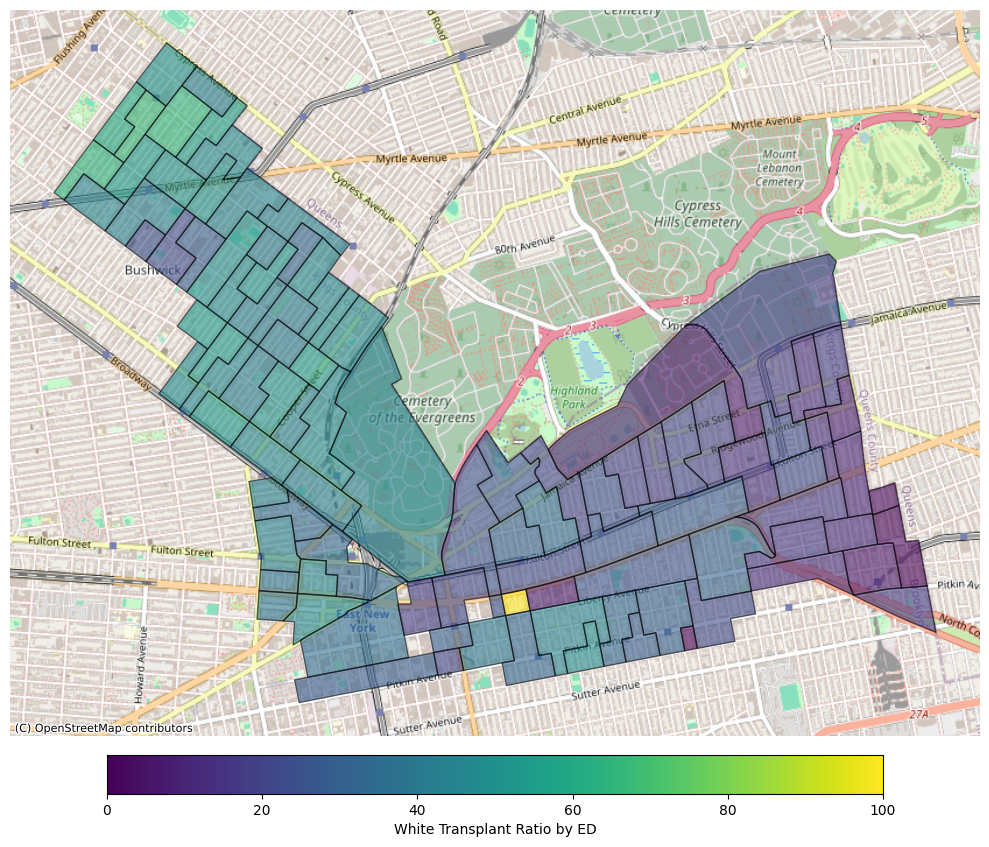

In [28]:
fig, ax = plt.subplots(figsize=(10, 10))
co_3857.plot(
    column='share_sandy_nurse_not_darma_v._diaz_pct',
    legend=True,
    legend_kwds={
        "label": "White Transplant Ratio by ED",
        "orientation": "horizontal",
        "shrink": 0.8,         # fraction of original size
        "pad": 0.02            # space between map and bar
    },
    ax=ax,
    alpha=0.6,
    edgecolor="k",
    cmap="viridis",
)

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

ax.set_axis_off()
plt.tight_layout()
plt.show()

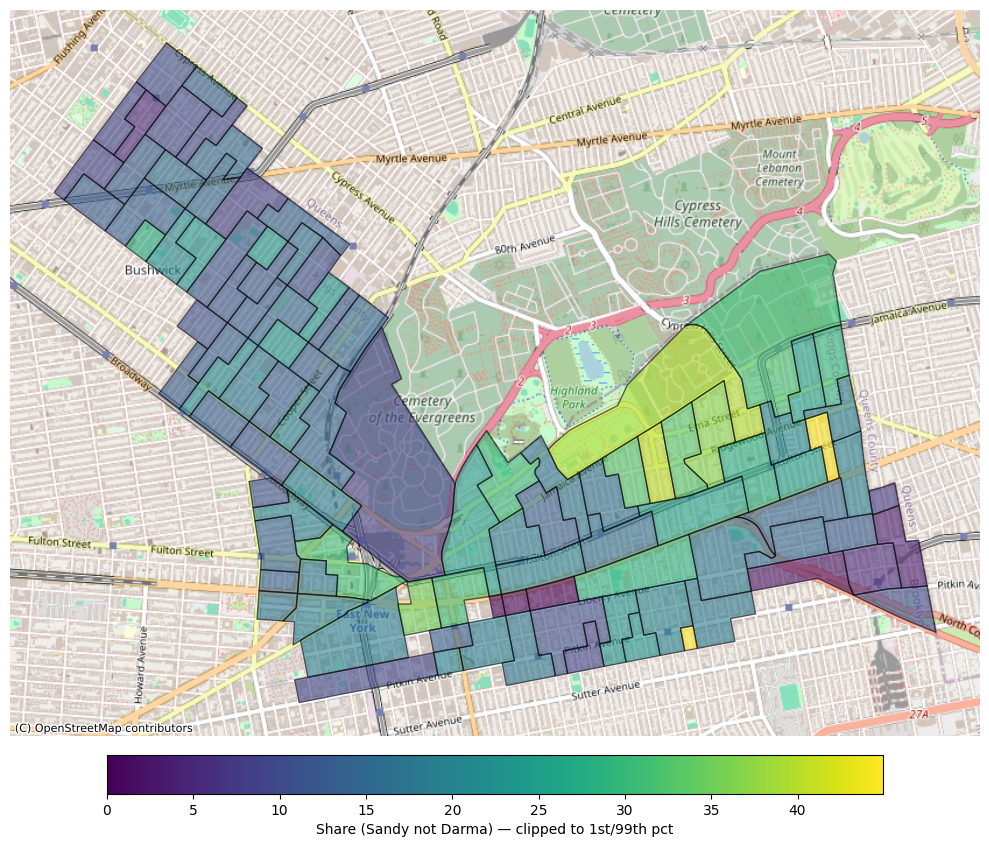

In [31]:
value_col = 'share_darma_v._diaz_not_sandy_nurse_pct' 
low_q = 0.01   
high_q = 0.99
cmap = "viridis"
alpha = 0.6
edgecolor = "k"


gdf_clip = co_3857.copy()
q_low, q_high = gdf_clip[value_col].quantile([low_q, high_q]).values


gdf_clip['share_clipped'] = gdf_clip[value_col].clip(lower=q_low, upper=q_high)

fig, ax = plt.subplots(figsize=(10, 10))
gdf_clip.plot(
    column='share_clipped',
    legend=True,
    legend_kwds={
        "label": "Share (Sandy not Darma) — clipped to 1st/99th pct",
        "orientation": "horizontal",
        "shrink": 0.8,
        "pad": 0.02
    },
    ax=ax,
    alpha=alpha,
    edgecolor=edgecolor,
    cmap=cmap,
)
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
ax.set_axis_off()
plt.tight_layout()
plt.show()

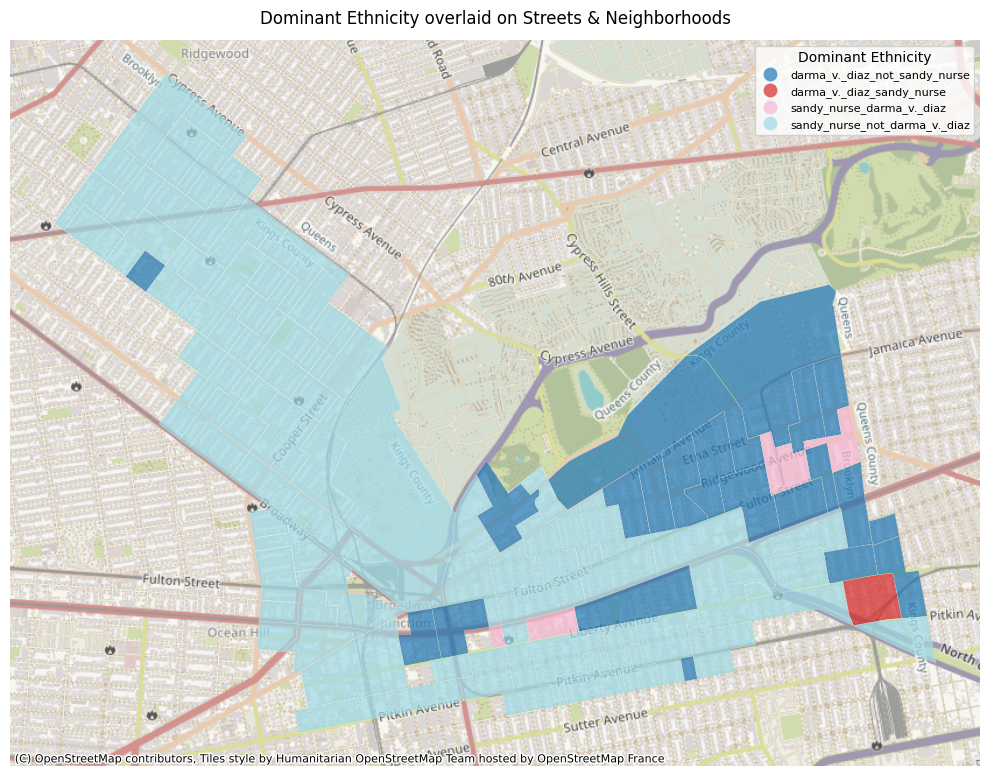

In [32]:
fig, ax = plt.subplots(figsize=(10, 10))

co_3857.plot(
    column='biggest',
    categorical=True,
    cmap='tab20',
    legend=True,
    alpha=0.7,
    ax=ax,
    edgecolor='white',
    linewidth=0.2,
    legend_kwds={'title': 'Dominant Ethnicity', 'fontsize': 8, 'title_fontsize': 10}
)

ctx.add_basemap(
    ax,
    #source=ctx.providers.CartoDB.Positron,  
    zoom=14   
)

ax.set_axis_off()
ax.set_title("Dominant Ethnicity overlaid on Streets & Neighborhoods", pad=12)

plt.tight_layout()
plt.show()